In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as utils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
# the path to the root of the dataset folder
dataroot = 'bmw10_ims/'
# the number of worker threads for loading the data with the DataLoader
workers = 2
# the batch size used in training. 128 from DCGAN paper
batch_size = 128
# the spatial size of the images used for training
image_size = 64
# number of color channels in the input images. For color images this is 3
nc = 3
#  length of latent vector z
nz = 100
# Size of feature maps in generator
ngf = 64
# Size of feature maps in discriminator
ndf = 64
# Number of training epochs
num_epochs = 2000
# Learning rate for optimizers
lr = 0.0002
# Beta1 hyperparam for Adam optimizers
beta1 = 0.5
# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [3]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

def dataloader(data, batch_size, image_size, workers):
    # transforms
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
    # create dataset
    dataset = dset.ImageFolder(
        root=data,
        transform=transform,
    )
    # create dataloader
    loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                        shuffle=True) #num_workers=workers)
    
    return loader

In [4]:
imageloader = dataloader(dataroot, batch_size, image_size, workers)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


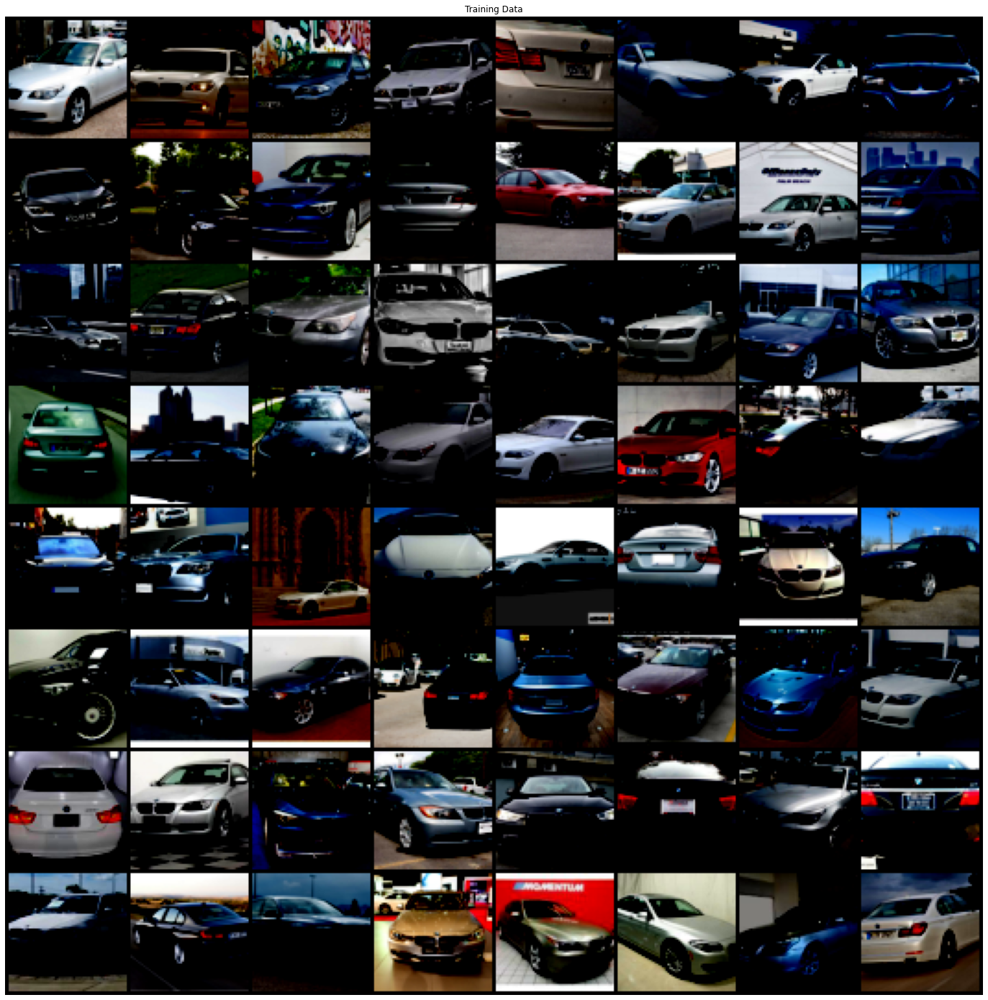

In [5]:
# visualizing real data
real_batch = next(iter(imageloader))
plt.figure(figsize=(25,25))
plt.axis("off")
plt.title("Training Data")
plt.imshow(np.transpose(utils.make_grid(real_batch[0].to(device)[:64], padding=2).cpu(), (1,2,0)))

In [6]:
# weight initialization
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [7]:
# Generator

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [8]:
# generator mode
G = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    G = nn.DataParallel(G, list(range(ngpu)))


# apply the weights_init function to randomly initialize all weights
# to mean=0, stdev=0.2.
G.apply(weights_init)

print(G)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [9]:
# Discriminator

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [10]:
# generator mode
D = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    D = nn.DataParallel(D, list(range(ngpu)))

# apply the weights_init function to randomly initialize all weights
# to mean=0, stdev=0.2.
D.apply(weights_init)

print(D)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [11]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# batch of latent vectors that we will use to visualize
# the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(D.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(G.parameters(), lr=lr, betas=(beta1, 0.999))

In [12]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(imageloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        D.zero_grad()
        # Format batch
        real_images = data[0].to(device)
        b_size = real_images.size(0)
        label = torch.full((b_size,), real_label, device=device, dtype=torch.float)
        # Forward pass real batch through D
        output = D(real_images).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = G(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = D(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        G.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = D(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(imageloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(imageloader)-1)):
            with torch.no_grad():
                fake = G(fixed_noise).detach().cpu()
            img_list.append(utils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/2000][0/4]	Loss_D: 1.6905	Loss_G: 3.6511	D(x): 0.3996	D(G(z)): 0.3855 / 0.0361
[1/2000][0/4]	Loss_D: 1.1341	Loss_G: 6.3395	D(x): 0.7678	D(G(z)): 0.4359 / 0.0029
[2/2000][0/4]	Loss_D: 0.5076	Loss_G: 7.4462	D(x): 0.8143	D(G(z)): 0.1442 / 0.0010
[3/2000][0/4]	Loss_D: 0.3323	Loss_G: 8.5131	D(x): 0.8517	D(G(z)): 0.0617 / 0.0004
[4/2000][0/4]	Loss_D: 0.2872	Loss_G: 10.8142	D(x): 0.9306	D(G(z)): 0.1636 / 0.0000
[5/2000][0/4]	Loss_D: 0.8547	Loss_G: 15.2455	D(x): 0.8992	D(G(z)): 0.4559 / 0.0000
[6/2000][0/4]	Loss_D: 0.5764	Loss_G: 20.0464	D(x): 0.6608	D(G(z)): 0.0000 / 0.0000
[7/2000][0/4]	Loss_D: 0.3413	Loss_G: 20.1939	D(x): 0.7742	D(G(z)): 0.0000 / 0.0000
[8/2000][0/4]	Loss_D: 0.2104	Loss_G: 19.9870	D(x): 0.8436	D(G(z)): 0.0000 / 0.0000
[9/2000][0/4]	Loss_D: 0.3107	Loss_G: 19.9036	D(x): 0.7870	D(G(z)): 0.0000 / 0.0000
[10/2000][0/4]	Loss_D: 0.3990	Loss_G: 19.4071	D(x): 0.7634	D(G(z)): 0.0000 / 0.0000
[11/2000][0/4]	Loss_D: 0.3423	Loss_G: 18.7087	D(x): 0.7690	D(G(z

[99/2000][0/4]	Loss_D: 0.4333	Loss_G: 6.5427	D(x): 0.8952	D(G(z)): 0.2447 / 0.0025
[100/2000][0/4]	Loss_D: 0.3420	Loss_G: 5.3255	D(x): 0.9543	D(G(z)): 0.2121 / 0.0105
[101/2000][0/4]	Loss_D: 0.7009	Loss_G: 9.3199	D(x): 0.9607	D(G(z)): 0.4256 / 0.0002
[102/2000][0/4]	Loss_D: 0.3415	Loss_G: 4.1416	D(x): 0.8277	D(G(z)): 0.0932 / 0.0490
[103/2000][0/4]	Loss_D: 0.5482	Loss_G: 4.2457	D(x): 0.6584	D(G(z)): 0.0110 / 0.0399
[104/2000][0/4]	Loss_D: 0.3423	Loss_G: 4.3975	D(x): 0.7966	D(G(z)): 0.0425 / 0.0271
[105/2000][0/4]	Loss_D: 0.2793	Loss_G: 6.4593	D(x): 0.9383	D(G(z)): 0.1738 / 0.0031
[106/2000][0/4]	Loss_D: 0.1612	Loss_G: 4.1584	D(x): 0.9095	D(G(z)): 0.0538 / 0.0295
[107/2000][0/4]	Loss_D: 0.5083	Loss_G: 6.0211	D(x): 0.8944	D(G(z)): 0.2907 / 0.0063
[108/2000][0/4]	Loss_D: 0.2501	Loss_G: 4.2442	D(x): 0.9148	D(G(z)): 0.1347 / 0.0230
[109/2000][0/4]	Loss_D: 0.2270	Loss_G: 4.7125	D(x): 0.8906	D(G(z)): 0.0952 / 0.0140
[110/2000][0/4]	Loss_D: 0.3036	Loss_G: 4.1648	D(x): 0.8687	D(G(z)): 0.1319 / 

[197/2000][0/4]	Loss_D: 0.1474	Loss_G: 4.7393	D(x): 0.9100	D(G(z)): 0.0425 / 0.0144
[198/2000][0/4]	Loss_D: 0.1517	Loss_G: 4.4457	D(x): 0.9194	D(G(z)): 0.0595 / 0.0204
[199/2000][0/4]	Loss_D: 0.2687	Loss_G: 5.7790	D(x): 0.9156	D(G(z)): 0.1515 / 0.0054
[200/2000][0/4]	Loss_D: 0.1663	Loss_G: 4.1624	D(x): 0.9208	D(G(z)): 0.0731 / 0.0264
[201/2000][0/4]	Loss_D: 0.2220	Loss_G: 4.7935	D(x): 0.8259	D(G(z)): 0.0146 / 0.0173
[202/2000][0/4]	Loss_D: 0.1602	Loss_G: 3.9512	D(x): 0.8904	D(G(z)): 0.0343 / 0.0314
[203/2000][0/4]	Loss_D: 0.4888	Loss_G: 4.6867	D(x): 0.6560	D(G(z)): 0.0032 / 0.0235
[204/2000][0/4]	Loss_D: 0.2895	Loss_G: 7.2998	D(x): 0.9743	D(G(z)): 0.2082 / 0.0012
[205/2000][0/4]	Loss_D: 1.5783	Loss_G: 13.3877	D(x): 0.9976	D(G(z)): 0.6101 / 0.0000
[206/2000][0/4]	Loss_D: 0.4566	Loss_G: 3.3442	D(x): 0.8449	D(G(z)): 0.1484 / 0.0887
[207/2000][0/4]	Loss_D: 0.3192	Loss_G: 5.8224	D(x): 0.7975	D(G(z)): 0.0339 / 0.0097
[208/2000][0/4]	Loss_D: 0.5511	Loss_G: 5.9426	D(x): 0.8395	D(G(z)): 0.2523 

[295/2000][0/4]	Loss_D: 0.1003	Loss_G: 4.3592	D(x): 0.9356	D(G(z)): 0.0314 / 0.0224
[296/2000][0/4]	Loss_D: 0.1288	Loss_G: 4.4212	D(x): 0.9518	D(G(z)): 0.0694 / 0.0205
[297/2000][0/4]	Loss_D: 0.1013	Loss_G: 4.7689	D(x): 0.9466	D(G(z)): 0.0425 / 0.0154
[298/2000][0/4]	Loss_D: 0.1625	Loss_G: 4.6701	D(x): 0.9631	D(G(z)): 0.1080 / 0.0156
[299/2000][0/4]	Loss_D: 0.1316	Loss_G: 4.5262	D(x): 0.9493	D(G(z)): 0.0705 / 0.0176
[300/2000][0/4]	Loss_D: 0.1142	Loss_G: 3.8684	D(x): 0.9332	D(G(z)): 0.0419 / 0.0298
[301/2000][0/4]	Loss_D: 0.1315	Loss_G: 4.3721	D(x): 0.9504	D(G(z)): 0.0733 / 0.0185
[302/2000][0/4]	Loss_D: 0.1515	Loss_G: 5.5239	D(x): 0.9807	D(G(z)): 0.1163 / 0.0061
[303/2000][0/4]	Loss_D: 0.1009	Loss_G: 4.4537	D(x): 0.9340	D(G(z)): 0.0295 / 0.0194
[304/2000][0/4]	Loss_D: 0.1120	Loss_G: 4.5255	D(x): 0.9474	D(G(z)): 0.0534 / 0.0180
[305/2000][0/4]	Loss_D: 0.1098	Loss_G: 3.8862	D(x): 0.9454	D(G(z)): 0.0490 / 0.0328
[306/2000][0/4]	Loss_D: 0.1561	Loss_G: 4.2073	D(x): 0.8780	D(G(z)): 0.0161 /

[393/2000][0/4]	Loss_D: 0.0746	Loss_G: 4.4263	D(x): 0.9670	D(G(z)): 0.0389 / 0.0183
[394/2000][0/4]	Loss_D: 0.0916	Loss_G: 3.5877	D(x): 0.9448	D(G(z)): 0.0331 / 0.0391
[395/2000][0/4]	Loss_D: 0.1133	Loss_G: 5.1049	D(x): 0.9716	D(G(z)): 0.0771 / 0.0096
[396/2000][0/4]	Loss_D: 0.0770	Loss_G: 4.0571	D(x): 0.9571	D(G(z)): 0.0314 / 0.0269
[397/2000][0/4]	Loss_D: 0.0766	Loss_G: 4.1441	D(x): 0.9452	D(G(z)): 0.0192 / 0.0246
[398/2000][0/4]	Loss_D: 0.0795	Loss_G: 4.3983	D(x): 0.9731	D(G(z)): 0.0492 / 0.0186
[399/2000][0/4]	Loss_D: 0.0907	Loss_G: 4.9057	D(x): 0.9807	D(G(z)): 0.0659 / 0.0106
[400/2000][0/4]	Loss_D: 0.0585	Loss_G: 4.4444	D(x): 0.9748	D(G(z)): 0.0319 / 0.0170
[401/2000][0/4]	Loss_D: 0.0799	Loss_G: 4.3429	D(x): 0.9556	D(G(z)): 0.0329 / 0.0197
[402/2000][0/4]	Loss_D: 0.0770	Loss_G: 4.4599	D(x): 0.9792	D(G(z)): 0.0528 / 0.0159
[403/2000][0/4]	Loss_D: 0.0546	Loss_G: 4.2780	D(x): 0.9748	D(G(z)): 0.0281 / 0.0195
[404/2000][0/4]	Loss_D: 0.0645	Loss_G: 4.7741	D(x): 0.9766	D(G(z)): 0.0392 /

[491/2000][0/4]	Loss_D: 0.3846	Loss_G: 5.2566	D(x): 0.9459	D(G(z)): 0.2367 / 0.0097
[492/2000][0/4]	Loss_D: 0.4334	Loss_G: 5.9874	D(x): 0.8824	D(G(z)): 0.2221 / 0.0049
[493/2000][0/4]	Loss_D: 0.3515	Loss_G: 5.8163	D(x): 0.9131	D(G(z)): 0.1853 / 0.0076
[494/2000][0/4]	Loss_D: 0.4588	Loss_G: 6.2009	D(x): 0.9071	D(G(z)): 0.2661 / 0.0034
[495/2000][0/4]	Loss_D: 0.2168	Loss_G: 4.7752	D(x): 0.8776	D(G(z)): 0.0702 / 0.0139
[496/2000][0/4]	Loss_D: 0.1783	Loss_G: 4.9887	D(x): 0.9150	D(G(z)): 0.0774 / 0.0129
[497/2000][0/4]	Loss_D: 0.5035	Loss_G: 3.3344	D(x): 0.6698	D(G(z)): 0.0212 / 0.0768
[498/2000][0/4]	Loss_D: 0.4195	Loss_G: 7.7396	D(x): 0.9581	D(G(z)): 0.2485 / 0.0013
[499/2000][0/4]	Loss_D: 0.2305	Loss_G: 5.9601	D(x): 0.9454	D(G(z)): 0.1409 / 0.0062
[500/2000][0/4]	Loss_D: 0.1860	Loss_G: 5.3510	D(x): 0.8743	D(G(z)): 0.0370 / 0.0105
[501/2000][0/4]	Loss_D: 0.2051	Loss_G: 5.6466	D(x): 0.9501	D(G(z)): 0.1272 / 0.0057
[502/2000][0/4]	Loss_D: 0.2113	Loss_G: 5.0633	D(x): 0.9332	D(G(z)): 0.1173 /

[589/2000][0/4]	Loss_D: 0.0452	Loss_G: 4.5264	D(x): 0.9839	D(G(z)): 0.0280 / 0.0151
[590/2000][0/4]	Loss_D: 0.0473	Loss_G: 4.3953	D(x): 0.9709	D(G(z)): 0.0174 / 0.0186
[591/2000][0/4]	Loss_D: 0.0518	Loss_G: 4.3151	D(x): 0.9641	D(G(z)): 0.0149 / 0.0208
[592/2000][0/4]	Loss_D: 0.0459	Loss_G: 4.5063	D(x): 0.9778	D(G(z)): 0.0229 / 0.0156
[593/2000][0/4]	Loss_D: 0.0419	Loss_G: 4.8218	D(x): 0.9812	D(G(z)): 0.0223 / 0.0129
[594/2000][0/4]	Loss_D: 0.0450	Loss_G: 4.6502	D(x): 0.9851	D(G(z)): 0.0288 / 0.0129
[595/2000][0/4]	Loss_D: 0.0552	Loss_G: 4.9033	D(x): 0.9866	D(G(z)): 0.0397 / 0.0103
[596/2000][0/4]	Loss_D: 0.0429	Loss_G: 4.3641	D(x): 0.9746	D(G(z)): 0.0169 / 0.0181
[597/2000][0/4]	Loss_D: 0.0492	Loss_G: 4.7405	D(x): 0.9819	D(G(z)): 0.0296 / 0.0136
[598/2000][0/4]	Loss_D: 0.0364	Loss_G: 4.9110	D(x): 0.9824	D(G(z)): 0.0181 / 0.0110
[599/2000][0/4]	Loss_D: 0.0430	Loss_G: 4.4134	D(x): 0.9761	D(G(z)): 0.0184 / 0.0170
[600/2000][0/4]	Loss_D: 0.0521	Loss_G: 4.2345	D(x): 0.9685	D(G(z)): 0.0195 /

[687/2000][0/4]	Loss_D: 0.0300	Loss_G: 4.8354	D(x): 0.9846	D(G(z)): 0.0143 / 0.0122
[688/2000][0/4]	Loss_D: 0.0281	Loss_G: 4.7517	D(x): 0.9811	D(G(z)): 0.0090 / 0.0133
[689/2000][0/4]	Loss_D: 0.0321	Loss_G: 4.4617	D(x): 0.9789	D(G(z)): 0.0106 / 0.0176
[690/2000][0/4]	Loss_D: 0.0314	Loss_G: 4.9692	D(x): 0.9902	D(G(z)): 0.0211 / 0.0096
[691/2000][0/4]	Loss_D: 0.0272	Loss_G: 4.8725	D(x): 0.9843	D(G(z)): 0.0112 / 0.0110
[692/2000][0/4]	Loss_D: 0.0306	Loss_G: 4.5429	D(x): 0.9816	D(G(z)): 0.0119 / 0.0152
[693/2000][0/4]	Loss_D: 0.0267	Loss_G: 4.7442	D(x): 0.9847	D(G(z)): 0.0112 / 0.0131
[694/2000][0/4]	Loss_D: 0.0270	Loss_G: 4.7993	D(x): 0.9849	D(G(z)): 0.0117 / 0.0116
[695/2000][0/4]	Loss_D: 0.0349	Loss_G: 5.2727	D(x): 0.9921	D(G(z)): 0.0261 / 0.0067
[696/2000][0/4]	Loss_D: 0.0276	Loss_G: 5.1919	D(x): 0.9873	D(G(z)): 0.0146 / 0.0080
[697/2000][0/4]	Loss_D: 0.0260	Loss_G: 5.0087	D(x): 0.9877	D(G(z)): 0.0133 / 0.0099
[698/2000][0/4]	Loss_D: 0.0232	Loss_G: 5.1861	D(x): 0.9868	D(G(z)): 0.0098 /

[785/2000][0/4]	Loss_D: 0.0172	Loss_G: 5.4279	D(x): 0.9929	D(G(z)): 0.0099 / 0.0063
[786/2000][0/4]	Loss_D: 0.0171	Loss_G: 5.3418	D(x): 0.9922	D(G(z)): 0.0092 / 0.0067
[787/2000][0/4]	Loss_D: 0.0173	Loss_G: 5.6692	D(x): 0.9905	D(G(z)): 0.0076 / 0.0058
[788/2000][0/4]	Loss_D: 0.0176	Loss_G: 5.0253	D(x): 0.9918	D(G(z)): 0.0093 / 0.0095
[789/2000][0/4]	Loss_D: 0.0188	Loss_G: 5.1315	D(x): 0.9892	D(G(z)): 0.0078 / 0.0088
[790/2000][0/4]	Loss_D: 0.0190	Loss_G: 5.4241	D(x): 0.9911	D(G(z)): 0.0100 / 0.0069
[791/2000][0/4]	Loss_D: 0.0179	Loss_G: 5.5155	D(x): 0.9916	D(G(z)): 0.0093 / 0.0059
[792/2000][0/4]	Loss_D: 0.0194	Loss_G: 4.9778	D(x): 0.9881	D(G(z)): 0.0074 / 0.0097
[793/2000][0/4]	Loss_D: 0.0197	Loss_G: 4.9557	D(x): 0.9914	D(G(z)): 0.0109 / 0.0097
[794/2000][0/4]	Loss_D: 0.0156	Loss_G: 5.5775	D(x): 0.9923	D(G(z)): 0.0079 / 0.0054
[795/2000][0/4]	Loss_D: 0.0170	Loss_G: 5.2284	D(x): 0.9931	D(G(z)): 0.0099 / 0.0080
[796/2000][0/4]	Loss_D: 0.0180	Loss_G: 5.2824	D(x): 0.9927	D(G(z)): 0.0106 /

[883/2000][0/4]	Loss_D: 0.0142	Loss_G: 5.7815	D(x): 0.9945	D(G(z)): 0.0087 / 0.0046
[884/2000][0/4]	Loss_D: 0.0140	Loss_G: 5.6425	D(x): 0.9937	D(G(z)): 0.0077 / 0.0056
[885/2000][0/4]	Loss_D: 0.0117	Loss_G: 5.8739	D(x): 0.9952	D(G(z)): 0.0068 / 0.0044
[886/2000][0/4]	Loss_D: 0.0135	Loss_G: 5.8800	D(x): 0.9947	D(G(z)): 0.0080 / 0.0040
[887/2000][0/4]	Loss_D: 0.0101	Loss_G: 6.1851	D(x): 0.9951	D(G(z)): 0.0052 / 0.0033
[888/2000][0/4]	Loss_D: 0.0120	Loss_G: 5.7989	D(x): 0.9953	D(G(z)): 0.0071 / 0.0048
[889/2000][0/4]	Loss_D: 0.0125	Loss_G: 5.6667	D(x): 0.9919	D(G(z)): 0.0044 / 0.0053
[890/2000][0/4]	Loss_D: 0.0115	Loss_G: 5.7995	D(x): 0.9960	D(G(z)): 0.0074 / 0.0046
[891/2000][0/4]	Loss_D: 0.0119	Loss_G: 6.1730	D(x): 0.9943	D(G(z)): 0.0060 / 0.0037
[892/2000][0/4]	Loss_D: 0.0132	Loss_G: 5.8054	D(x): 0.9949	D(G(z)): 0.0080 / 0.0049
[893/2000][0/4]	Loss_D: 0.0112	Loss_G: 5.8019	D(x): 0.9943	D(G(z)): 0.0055 / 0.0047
[894/2000][0/4]	Loss_D: 0.0102	Loss_G: 5.7751	D(x): 0.9953	D(G(z)): 0.0055 /

[981/2000][0/4]	Loss_D: 0.0086	Loss_G: 6.1131	D(x): 0.9958	D(G(z)): 0.0043 / 0.0037
[982/2000][0/4]	Loss_D: 0.0092	Loss_G: 6.1607	D(x): 0.9958	D(G(z)): 0.0050 / 0.0032
[983/2000][0/4]	Loss_D: 0.0086	Loss_G: 5.9749	D(x): 0.9957	D(G(z)): 0.0043 / 0.0037
[984/2000][0/4]	Loss_D: 0.0088	Loss_G: 6.2451	D(x): 0.9961	D(G(z)): 0.0049 / 0.0032
[985/2000][0/4]	Loss_D: 0.0088	Loss_G: 6.0152	D(x): 0.9959	D(G(z)): 0.0046 / 0.0038
[986/2000][0/4]	Loss_D: 0.0100	Loss_G: 6.0699	D(x): 0.9953	D(G(z)): 0.0052 / 0.0038
[987/2000][0/4]	Loss_D: 0.0079	Loss_G: 6.1835	D(x): 0.9963	D(G(z)): 0.0041 / 0.0034
[988/2000][0/4]	Loss_D: 0.0077	Loss_G: 6.1393	D(x): 0.9966	D(G(z)): 0.0043 / 0.0033
[989/2000][0/4]	Loss_D: 0.0074	Loss_G: 6.3438	D(x): 0.9970	D(G(z)): 0.0044 / 0.0027
[990/2000][0/4]	Loss_D: 0.0079	Loss_G: 6.2494	D(x): 0.9961	D(G(z)): 0.0040 / 0.0034
[991/2000][0/4]	Loss_D: 0.0074	Loss_G: 6.3035	D(x): 0.9970	D(G(z)): 0.0043 / 0.0030
[992/2000][0/4]	Loss_D: 0.0094	Loss_G: 6.1704	D(x): 0.9972	D(G(z)): 0.0065 /

[1078/2000][0/4]	Loss_D: 0.0063	Loss_G: 6.3710	D(x): 0.9968	D(G(z)): 0.0030 / 0.0028
[1079/2000][0/4]	Loss_D: 0.0061	Loss_G: 6.4476	D(x): 0.9973	D(G(z)): 0.0034 / 0.0026
[1080/2000][0/4]	Loss_D: 0.0055	Loss_G: 6.3892	D(x): 0.9970	D(G(z)): 0.0024 / 0.0024
[1081/2000][0/4]	Loss_D: 0.0062	Loss_G: 6.6264	D(x): 0.9964	D(G(z)): 0.0026 / 0.0022
[1082/2000][0/4]	Loss_D: 0.0060	Loss_G: 6.5568	D(x): 0.9961	D(G(z)): 0.0021 / 0.0024
[1083/2000][0/4]	Loss_D: 0.0054	Loss_G: 6.5181	D(x): 0.9974	D(G(z)): 0.0028 / 0.0024
[1084/2000][0/4]	Loss_D: 0.0054	Loss_G: 6.6260	D(x): 0.9978	D(G(z)): 0.0032 / 0.0021
[1085/2000][0/4]	Loss_D: 0.0060	Loss_G: 6.4577	D(x): 0.9975	D(G(z)): 0.0035 / 0.0024
[1086/2000][0/4]	Loss_D: 0.0045	Loss_G: 6.7526	D(x): 0.9982	D(G(z)): 0.0026 / 0.0018
[1087/2000][0/4]	Loss_D: 0.0051	Loss_G: 6.4737	D(x): 0.9979	D(G(z)): 0.0030 / 0.0023
[1088/2000][0/4]	Loss_D: 0.0051	Loss_G: 6.3289	D(x): 0.9976	D(G(z)): 0.0028 / 0.0025
[1089/2000][0/4]	Loss_D: 0.0055	Loss_G: 6.6188	D(x): 0.9972	D(G(z

[1175/2000][0/4]	Loss_D: 1.0120	Loss_G: 1.8870	D(x): 0.6904	D(G(z)): 0.4094 / 0.1918
[1176/2000][0/4]	Loss_D: 1.0443	Loss_G: 2.1144	D(x): 0.6943	D(G(z)): 0.4329 / 0.1521
[1177/2000][0/4]	Loss_D: 1.1365	Loss_G: 1.1784	D(x): 0.4629	D(G(z)): 0.2008 / 0.3662
[1178/2000][0/4]	Loss_D: 0.9531	Loss_G: 1.7928	D(x): 0.5671	D(G(z)): 0.2537 / 0.1973
[1179/2000][0/4]	Loss_D: 0.9171	Loss_G: 2.2365	D(x): 0.7018	D(G(z)): 0.3775 / 0.1375
[1180/2000][0/4]	Loss_D: 0.9870	Loss_G: 2.2151	D(x): 0.7130	D(G(z)): 0.4179 / 0.1451
[1181/2000][0/4]	Loss_D: 0.8491	Loss_G: 1.6672	D(x): 0.6590	D(G(z)): 0.3014 / 0.2221
[1182/2000][0/4]	Loss_D: 0.9678	Loss_G: 1.6029	D(x): 0.5625	D(G(z)): 0.2471 / 0.2471
[1183/2000][0/4]	Loss_D: 0.8333	Loss_G: 2.5684	D(x): 0.7033	D(G(z)): 0.3312 / 0.1018
[1184/2000][0/4]	Loss_D: 0.9430	Loss_G: 3.4297	D(x): 0.8250	D(G(z)): 0.4792 / 0.0500
[1185/2000][0/4]	Loss_D: 1.1617	Loss_G: 3.0308	D(x): 0.7965	D(G(z)): 0.5300 / 0.0772
[1186/2000][0/4]	Loss_D: 0.8762	Loss_G: 2.0647	D(x): 0.6399	D(G(z

[1272/2000][0/4]	Loss_D: 0.4144	Loss_G: 8.2744	D(x): 0.9627	D(G(z)): 0.2527 / 0.0007
[1273/2000][0/4]	Loss_D: 0.2314	Loss_G: 6.3522	D(x): 0.9411	D(G(z)): 0.1339 / 0.0043
[1274/2000][0/4]	Loss_D: 0.2535	Loss_G: 6.2146	D(x): 0.9611	D(G(z)): 0.1604 / 0.0046
[1275/2000][0/4]	Loss_D: 0.2366	Loss_G: 5.3766	D(x): 0.8599	D(G(z)): 0.0602 / 0.0134
[1276/2000][0/4]	Loss_D: 0.2279	Loss_G: 7.3136	D(x): 0.9377	D(G(z)): 0.1267 / 0.0022
[1277/2000][0/4]	Loss_D: 0.2635	Loss_G: 7.3372	D(x): 0.9549	D(G(z)): 0.1645 / 0.0016
[1278/2000][0/4]	Loss_D: 0.2301	Loss_G: 5.8887	D(x): 0.8967	D(G(z)): 0.0937 / 0.0070
[1279/2000][0/4]	Loss_D: 0.1653	Loss_G: 5.9994	D(x): 0.9355	D(G(z)): 0.0840 / 0.0050
[1280/2000][0/4]	Loss_D: 0.3580	Loss_G: 8.8807	D(x): 0.9833	D(G(z)): 0.2401 / 0.0004
[1281/2000][0/4]	Loss_D: 0.2448	Loss_G: 5.3508	D(x): 0.8452	D(G(z)): 0.0384 / 0.0149
[1282/2000][0/4]	Loss_D: 0.1634	Loss_G: 6.1229	D(x): 0.9445	D(G(z)): 0.0868 / 0.0046
[1283/2000][0/4]	Loss_D: 0.2240	Loss_G: 6.1599	D(x): 0.9535	D(G(z

[1369/2000][0/4]	Loss_D: 0.0519	Loss_G: 6.2342	D(x): 0.9878	D(G(z)): 0.0356 / 0.0045
[1370/2000][0/4]	Loss_D: 0.0443	Loss_G: 5.9074	D(x): 0.9794	D(G(z)): 0.0220 / 0.0051
[1371/2000][0/4]	Loss_D: 0.0461	Loss_G: 5.4734	D(x): 0.9830	D(G(z)): 0.0279 / 0.0073
[1372/2000][0/4]	Loss_D: 0.0401	Loss_G: 5.2688	D(x): 0.9742	D(G(z)): 0.0135 / 0.0104
[1373/2000][0/4]	Loss_D: 0.0483	Loss_G: 5.7688	D(x): 0.9791	D(G(z)): 0.0260 / 0.0060
[1374/2000][0/4]	Loss_D: 0.0381	Loss_G: 5.5162	D(x): 0.9858	D(G(z)): 0.0229 / 0.0084
[1375/2000][0/4]	Loss_D: 0.0527	Loss_G: 5.9015	D(x): 0.9890	D(G(z)): 0.0378 / 0.0049
[1376/2000][0/4]	Loss_D: 0.0477	Loss_G: 5.8391	D(x): 0.9873	D(G(z)): 0.0321 / 0.0048
[1377/2000][0/4]	Loss_D: 0.0359	Loss_G: 5.4708	D(x): 0.9819	D(G(z)): 0.0172 / 0.0083
[1378/2000][0/4]	Loss_D: 0.0486	Loss_G: 5.8667	D(x): 0.9861	D(G(z)): 0.0313 / 0.0055
[1379/2000][0/4]	Loss_D: 0.0433	Loss_G: 5.6903	D(x): 0.9790	D(G(z)): 0.0191 / 0.0061
[1380/2000][0/4]	Loss_D: 0.0417	Loss_G: 5.2312	D(x): 0.9700	D(G(z

[1466/2000][0/4]	Loss_D: 0.0159	Loss_G: 5.9945	D(x): 0.9914	D(G(z)): 0.0071 / 0.0047
[1467/2000][0/4]	Loss_D: 0.0220	Loss_G: 5.5428	D(x): 0.9871	D(G(z)): 0.0088 / 0.0079
[1468/2000][0/4]	Loss_D: 0.0187	Loss_G: 5.6433	D(x): 0.9945	D(G(z)): 0.0130 / 0.0061
[1469/2000][0/4]	Loss_D: 0.0172	Loss_G: 5.8317	D(x): 0.9931	D(G(z)): 0.0100 / 0.0057
[1470/2000][0/4]	Loss_D: 0.0164	Loss_G: 5.9298	D(x): 0.9941	D(G(z)): 0.0103 / 0.0052
[1471/2000][0/4]	Loss_D: 0.0168	Loss_G: 5.6336	D(x): 0.9935	D(G(z)): 0.0101 / 0.0064
[1472/2000][0/4]	Loss_D: 0.0201	Loss_G: 5.7134	D(x): 0.9931	D(G(z)): 0.0128 / 0.0059
[1473/2000][0/4]	Loss_D: 0.0189	Loss_G: 6.0715	D(x): 0.9878	D(G(z)): 0.0066 / 0.0052
[1474/2000][0/4]	Loss_D: 0.0188	Loss_G: 5.7026	D(x): 0.9897	D(G(z)): 0.0082 / 0.0073
[1475/2000][0/4]	Loss_D: 0.0160	Loss_G: 5.7011	D(x): 0.9916	D(G(z)): 0.0075 / 0.0058
[1476/2000][0/4]	Loss_D: 0.0150	Loss_G: 5.8691	D(x): 0.9910	D(G(z)): 0.0060 / 0.0050
[1477/2000][0/4]	Loss_D: 0.0169	Loss_G: 6.0402	D(x): 0.9938	D(G(z

[1563/2000][0/4]	Loss_D: 0.0107	Loss_G: 6.1500	D(x): 0.9937	D(G(z)): 0.0043 / 0.0045
[1564/2000][0/4]	Loss_D: 0.0097	Loss_G: 6.1314	D(x): 0.9969	D(G(z)): 0.0065 / 0.0041
[1565/2000][0/4]	Loss_D: 0.0103	Loss_G: 6.2811	D(x): 0.9959	D(G(z)): 0.0061 / 0.0036
[1566/2000][0/4]	Loss_D: 0.0096	Loss_G: 6.4211	D(x): 0.9954	D(G(z)): 0.0049 / 0.0033
[1567/2000][0/4]	Loss_D: 0.0130	Loss_G: 6.4422	D(x): 0.9974	D(G(z)): 0.0102 / 0.0030
[1568/2000][0/4]	Loss_D: 0.0094	Loss_G: 6.3583	D(x): 0.9949	D(G(z)): 0.0043 / 0.0033
[1569/2000][0/4]	Loss_D: 0.0092	Loss_G: 6.2109	D(x): 0.9958	D(G(z)): 0.0049 / 0.0040
[1570/2000][0/4]	Loss_D: 0.0123	Loss_G: 6.4096	D(x): 0.9945	D(G(z)): 0.0066 / 0.0032
[1571/2000][0/4]	Loss_D: 0.0108	Loss_G: 6.6878	D(x): 0.9963	D(G(z)): 0.0069 / 0.0026
[1572/2000][0/4]	Loss_D: 0.0097	Loss_G: 6.7706	D(x): 0.9964	D(G(z)): 0.0059 / 0.0022
[1573/2000][0/4]	Loss_D: 0.0131	Loss_G: 7.0158	D(x): 0.9961	D(G(z)): 0.0084 / 0.0021
[1574/2000][0/4]	Loss_D: 0.0128	Loss_G: 6.6986	D(x): 0.9964	D(G(z

[1660/2000][0/4]	Loss_D: 0.0074	Loss_G: 6.8609	D(x): 0.9970	D(G(z)): 0.0042 / 0.0022
[1661/2000][0/4]	Loss_D: 0.0054	Loss_G: 6.9170	D(x): 0.9976	D(G(z)): 0.0029 / 0.0020
[1662/2000][0/4]	Loss_D: 0.0061	Loss_G: 6.6429	D(x): 0.9969	D(G(z)): 0.0030 / 0.0023
[1663/2000][0/4]	Loss_D: 0.0060	Loss_G: 6.9812	D(x): 0.9964	D(G(z)): 0.0024 / 0.0021
[1664/2000][0/4]	Loss_D: 0.0054	Loss_G: 6.8497	D(x): 0.9968	D(G(z)): 0.0022 / 0.0021
[1665/2000][0/4]	Loss_D: 0.0078	Loss_G: 6.9098	D(x): 0.9963	D(G(z)): 0.0041 / 0.0021
[1666/2000][0/4]	Loss_D: 0.0069	Loss_G: 6.7714	D(x): 0.9977	D(G(z)): 0.0046 / 0.0023
[1667/2000][0/4]	Loss_D: 0.0053	Loss_G: 6.9597	D(x): 0.9976	D(G(z)): 0.0028 / 0.0019
[1668/2000][0/4]	Loss_D: 0.0060	Loss_G: 6.7227	D(x): 0.9971	D(G(z)): 0.0031 / 0.0024
[1669/2000][0/4]	Loss_D: 0.0060	Loss_G: 6.7152	D(x): 0.9967	D(G(z)): 0.0027 / 0.0027
[1670/2000][0/4]	Loss_D: 0.0068	Loss_G: 6.7867	D(x): 0.9955	D(G(z)): 0.0023 / 0.0025
[1671/2000][0/4]	Loss_D: 0.0061	Loss_G: 6.8332	D(x): 0.9978	D(G(z

[1757/2000][0/4]	Loss_D: 0.0036	Loss_G: 7.3855	D(x): 0.9979	D(G(z)): 0.0015 / 0.0015
[1758/2000][0/4]	Loss_D: 0.0051	Loss_G: 7.4494	D(x): 0.9984	D(G(z)): 0.0035 / 0.0014
[1759/2000][0/4]	Loss_D: 0.0051	Loss_G: 7.4056	D(x): 0.9983	D(G(z)): 0.0034 / 0.0015
[1760/2000][0/4]	Loss_D: 0.0045	Loss_G: 7.3706	D(x): 0.9983	D(G(z)): 0.0027 / 0.0013
[1761/2000][0/4]	Loss_D: 0.0039	Loss_G: 7.4392	D(x): 0.9979	D(G(z)): 0.0018 / 0.0013
[1762/2000][0/4]	Loss_D: 0.0043	Loss_G: 7.3560	D(x): 0.9980	D(G(z)): 0.0023 / 0.0015
[1763/2000][0/4]	Loss_D: 0.0049	Loss_G: 7.0836	D(x): 0.9975	D(G(z)): 0.0024 / 0.0018
[1764/2000][0/4]	Loss_D: 0.0046	Loss_G: 7.1655	D(x): 0.9978	D(G(z)): 0.0024 / 0.0019
[1765/2000][0/4]	Loss_D: 0.0039	Loss_G: 7.3786	D(x): 0.9981	D(G(z)): 0.0020 / 0.0015
[1766/2000][0/4]	Loss_D: 0.0043	Loss_G: 7.4826	D(x): 0.9982	D(G(z)): 0.0025 / 0.0012
[1767/2000][0/4]	Loss_D: 0.0040	Loss_G: 7.1137	D(x): 0.9980	D(G(z)): 0.0019 / 0.0016
[1768/2000][0/4]	Loss_D: 0.0041	Loss_G: 7.0807	D(x): 0.9979	D(G(z

[1854/2000][0/4]	Loss_D: 0.0038	Loss_G: 7.5375	D(x): 0.9987	D(G(z)): 0.0024 / 0.0011
[1855/2000][0/4]	Loss_D: 0.0025	Loss_G: 7.7750	D(x): 0.9988	D(G(z)): 0.0013 / 0.0009
[1856/2000][0/4]	Loss_D: 0.0030	Loss_G: 7.7649	D(x): 0.9985	D(G(z)): 0.0015 / 0.0010
[1857/2000][0/4]	Loss_D: 0.0031	Loss_G: 7.8657	D(x): 0.9988	D(G(z)): 0.0019 / 0.0009
[1858/2000][0/4]	Loss_D: 0.0034	Loss_G: 7.5986	D(x): 0.9991	D(G(z)): 0.0025 / 0.0011
[1859/2000][0/4]	Loss_D: 0.0030	Loss_G: 7.4320	D(x): 0.9986	D(G(z)): 0.0015 / 0.0012
[1860/2000][0/4]	Loss_D: 0.0027	Loss_G: 7.7210	D(x): 0.9988	D(G(z)): 0.0015 / 0.0009
[1861/2000][0/4]	Loss_D: 0.0028	Loss_G: 7.4916	D(x): 0.9986	D(G(z)): 0.0014 / 0.0011
[1862/2000][0/4]	Loss_D: 0.0034	Loss_G: 7.5704	D(x): 0.9986	D(G(z)): 0.0020 / 0.0011
[1863/2000][0/4]	Loss_D: 0.0040	Loss_G: 7.5224	D(x): 0.9986	D(G(z)): 0.0026 / 0.0012
[1864/2000][0/4]	Loss_D: 0.0040	Loss_G: 8.2816	D(x): 0.9987	D(G(z)): 0.0026 / 0.0007
[1865/2000][0/4]	Loss_D: 0.0032	Loss_G: 8.0566	D(x): 0.9982	D(G(z

[1951/2000][0/4]	Loss_D: 0.0025	Loss_G: 8.0016	D(x): 0.9990	D(G(z)): 0.0015 / 0.0008
[1952/2000][0/4]	Loss_D: 0.0022	Loss_G: 8.0648	D(x): 0.9993	D(G(z)): 0.0015 / 0.0008
[1953/2000][0/4]	Loss_D: 0.0023	Loss_G: 7.8863	D(x): 0.9991	D(G(z)): 0.0014 / 0.0008
[1954/2000][0/4]	Loss_D: 0.0019	Loss_G: 7.8263	D(x): 0.9993	D(G(z)): 0.0012 / 0.0008
[1955/2000][0/4]	Loss_D: 0.0017	Loss_G: 8.0065	D(x): 0.9992	D(G(z)): 0.0010 / 0.0007
[1956/2000][0/4]	Loss_D: 0.0019	Loss_G: 8.1592	D(x): 0.9990	D(G(z)): 0.0009 / 0.0007
[1957/2000][0/4]	Loss_D: 0.0016	Loss_G: 8.0360	D(x): 0.9993	D(G(z)): 0.0009 / 0.0006
[1958/2000][0/4]	Loss_D: 0.0018	Loss_G: 8.3872	D(x): 0.9991	D(G(z)): 0.0010 / 0.0006
[1959/2000][0/4]	Loss_D: 0.0018	Loss_G: 8.1136	D(x): 0.9993	D(G(z)): 0.0012 / 0.0007
[1960/2000][0/4]	Loss_D: 0.0018	Loss_G: 8.3085	D(x): 0.9989	D(G(z)): 0.0006 / 0.0006
[1961/2000][0/4]	Loss_D: 0.0016	Loss_G: 8.0987	D(x): 0.9991	D(G(z)): 0.0007 / 0.0007
[1962/2000][0/4]	Loss_D: 0.0019	Loss_G: 8.2713	D(x): 0.9989	D(G(z

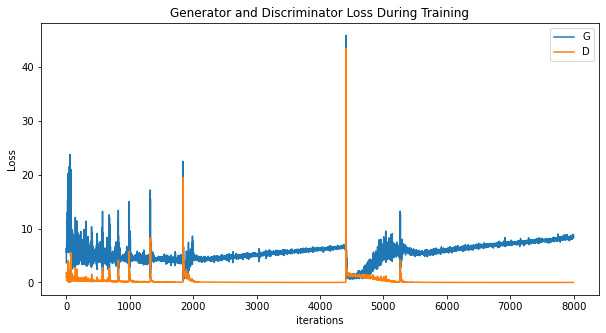

In [13]:
# losses
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

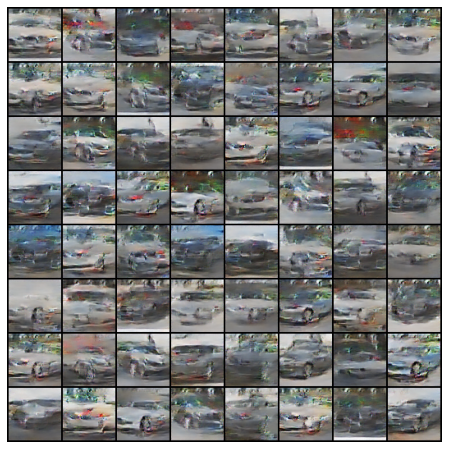

In [14]:
# visualizing G
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [15]:
torch.save(G.state_dict(), 'cars-0.0.0.pt')

In [22]:
# loading the trained model
G.load_state_dict(torch.load('faces-0.0.0.pt', map_location='cpu'))

<All keys matched successfully>

In [23]:
# latent vector z with a size 1 instead of 64
fixed_noise = torch.randn(128, nz, 1, 1, device=device)
# fake image
fake = G(fixed_noise).detach().cpu()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


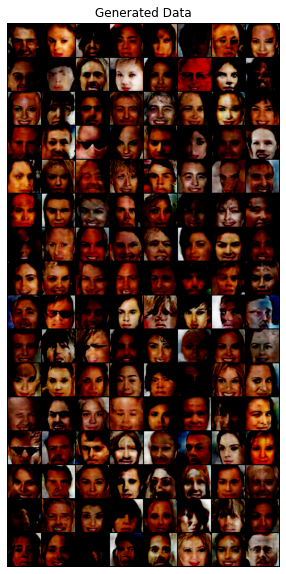

In [24]:
# visualizing the fake image
plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Generated Data")
plt.imshow(np.transpose(utils.make_grid(fake.to(device), padding=2).cpu(), (1,2,0)))

In [25]:
# scaling to between 0 and 1
def scale(x, feature_range=(-1, 1)):
    min, max = feature_range
    x = x / (max - min) - min
    
    return x

In [26]:
unormalized = scale(fake)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


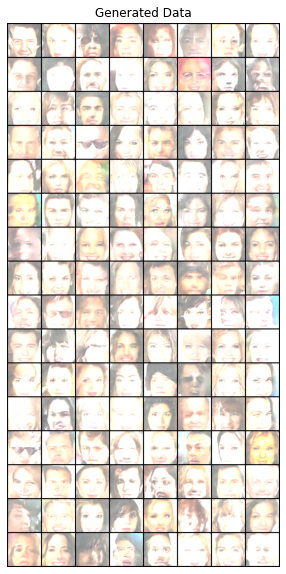

In [27]:
# visualizing the scaled fake image
plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Generated Data")
plt.imshow(np.transpose(utils.make_grid(unormalized.to(device), padding=2).cpu(), (1,2,0)))